<a href="https://colab.research.google.com/github/NPCA-TEAM/COVID-19/blob/main/Scripts/%207%20-%20UTILIZAR_MODELO_covid_ver3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Preparação preliminar

In [ ]:
#Inicia permitindo acesso ao Gdrive
from google.colab import drive
drive.mount('/content/drive')

## Instalação das bibliotecas

In [ ]:
!pip install pyyaml==5.4.1

In [ ]:
!pip install darts

In [ ]:
!pip install matplotlib==3.1.3 #é necessário restart runtime 

In [ ]:
!pip install pytorch-lightning

## Importação das bibliotecas

In [ ]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import pandas as pd
import numpy as np
import glob
import os
import sys
import time
import torch
import json

import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates

from datetime import datetime
from darts import timeseries
from darts.dataprocessing.transformers import Scaler

from darts.models import (    
    NBEATSModel,
    TCNModel,
    TransformerModel,
    TFTModel,
    NHiTSModel
)

from darts.metrics import mape, rmse, r2_score, coefficient_of_variation
from darts.utils.timeseries_generation import datetime_attribute_timeseries
from darts.models import KalmanFilter
from darts.utils.likelihood_models import GaussianLikelihood, DirichletLikelihood, BetaLikelihood, ContinuousBernoulliLikelihood

import warnings
warnings.filterwarnings('ignore')
import logging
logging.disable(logging.CRITICAL)
torch.manual_seed(1); np.random.seed(1)  # for reproducibility

# **Importação dos dados**

## Dados e campos de entrada

In [ ]:
#Campos de entrada do framework
serie_name_caso_sintoma = "Casos_DataSintoma_MM_atual_PA"   #Variavel onde será adicionada o nome para a serie a ser analisada
serie_name_caso_publicacao = "Casos_Publicacao_MM_atual_PA"   #Variavel onde será adicionada o nome para a serie a ser analisada
serie_name_obito_ocorrencia = "Obitos_DataOcorrencia_MM_atual_PA"   #Variavel onde será adicionada o nome para a serie a ser analisada
serie_name_obito_publicacao = "Obitos_Publicacao_MM_atual_PA"   #Variavel onde será adicionada o nome para a serie a ser analisada


#Numero de passos da previsão a frente da serie
num_days_forecast = 7


# Arquivo com a base de dados
path_dataset_casos = '/content/drive/MyDrive/NPCA - COVID/_CASOS/DataSet/'
path_dataset_obitos = '/content/drive/MyDrive/NPCA - COVID/_OBITOS/DataSet/'


#Pasta para salvar dados gerados 
path_figs_casos = '/content/drive/MyDrive/NPCA - COVID/_CASOS/Figs/'
path_figs_obitos = '/content/drive/MyDrive/NPCA - COVID/_OBITOS/Figs/'

path_csv_casos = '/content/drive/MyDrive/NPCA - COVID/_CASOS/ForecastsPredict/'
path_csv_obitos = '/content/drive/MyDrive/NPCA - COVID/_OBITOS/ForecastsPredict/'

## Leitura do dataset e seleção das variáveis

In [ ]:
#Seleciona o arquivo da base
file_list_casos = glob.glob(path_dataset_casos + '*')
file_list_obitos = glob.glob(path_dataset_obitos + '*')

#Seleciona o ultimo arquivo que foi criado e adiciona na pasta
file_path_casos = max(file_list_casos, key=os.path.getctime)
file_path_obitos = max(file_list_obitos, key=os.path.getctime)

#Faz leitura do arquivo excel como datafrade
dataframe_casos = pd.read_excel(file_path_casos, sheet_name=0)
dataframe_obitos = pd.read_excel(file_path_obitos, sheet_name=0)

In [ ]:
#dataframe_casos
#dataframe_obitos

In [ ]:
#Seleção das variáveis alvo
caso_sintoma = dataframe_casos.loc[:, ['data', 'Casos_DataSintoma_MM_atual_PA']]
caso_publicacao = dataframe_casos.loc[:, ['data', 'Casos_Publicacao_MM_atual_PA']]

obito_ocorrencia = dataframe_obitos.loc[:, ['data', 'Obitos_DataOcorrencia_MM_atual_PA']]
obito_publicacao = dataframe_obitos.loc[:, ['data', 'Obitos_Publicacao_MM_atual_PA']]


#Seleção das variáveis auxiliares
caso_sintoma_7dias = dataframe_casos.loc[:, ['data', 'Casos_DataSintoma_MM_7dias_PA']].fillna(0)
caso_publicacao_7dias = dataframe_casos.loc[:, ['data', 'Casos_Publicacao_MM_7dias_PA']].fillna(0)

obito_ocorrencia_7dias = dataframe_obitos.loc[:, ['data', 'Obitos_DataOcorrencia_MM_7dias_PA']].fillna(0)
obito_publicacao_7dias = dataframe_obitos.loc[:, ['data', 'Obitos_Publicacao_MM_7dias_PA']].fillna(0)

vacinacao_1Dose = dataframe_casos.loc[:, ['data', 'Vacinacao_Dose1_%decimal_PA']].fillna(0)
vacinacao_2Dose = dataframe_casos.loc[:, ['data', 'Vacinacao_Dose2_%decimal_PA']].fillna(0)
vacinacao_3Dose = dataframe_casos.loc[:, ['data', 'Vacinacao_Dose3_%decimal_PA']].fillna(0)


#Renomeia variaveis.
caso_sintoma_7DiasAnteriores = caso_sintoma_7dias.rename(columns = {'Casos_DataSintoma_MM_7dias_PA':'Casos_DataSintoma_MM_7diasAnteriores_PA'}, inplace = False)
caso_publicacao_7DiasAnteriores = caso_publicacao_7dias.rename(columns = {'Casos_Publicacao_MM_7dias_PA':'Casos_Publicacao_MM_7diasAnteriores_PA'}, inplace = False)

obito_ocorrencia_7DiasAnteriores = obito_ocorrencia_7dias.rename(columns = {'Obitos_DataOcorrencia_MM_7dias_PA':'Obitos_DataOcorrencia_MM_7diasAnteriores_PA'}, inplace = False)
obito_publicacao_7DiasAnteriores = obito_publicacao_7dias.rename(columns = {'Obitos_Publicacao_MM_7dias_PA':'Obitos_Publicacao_MM_7diasAnteriores_PA'}, inplace = False)

In [ ]:
#caso_sintoma_7DiasAnteriores
#caso_publicacao_7DiasAnteriores
#obito_ocorrencia_7DiasAnteriores
#obito_publicacao_7DiasAnteriores

## Seleção dos modelos

In [ ]:
def model_selection (casos_obitos, sintoma_publicacao_ocorrencia):
  #Caminho de onde estão os modelos
  if casos_obitos == 'casos':
    path_selected_models = '/content/drive/MyDrive/NPCA - COVID/_CASOS/SelectedModel/'
  elif casos_obitos == 'obitos':
    path_selected_models = '/content/drive/MyDrive/NPCA - COVID/_OBITOS/SelectedModel/'
  

  #Seleciona e ordenar os arquivos
  file_list_selected_models = glob.glob(f'{path_selected_models}*.csv')
  sorted_list_selected_models = sorted(file_list_selected_models, key=os.path.getctime, reverse=True)

  print('Lista de modelos:')
  print(*sorted_list_selected_models,sep='\n')


  #Selecionar o caminho dos modelos
  selected_models = list(filter(lambda x: sintoma_publicacao_ocorrencia in x, sorted_list_selected_models))[0]
  dataframe_selected_models = pd.read_csv(selected_models)
  path_best_model = dataframe_selected_models['path'][0]
  best_model = dataframe_selected_models['model'][0]

  print(f'\nEndereço do melhor modelo: {path_best_model}')
  print(f'Melhor modelo: {best_model}')


  # Carregar modelos selecionados
  if ('NBEATS' in best_model):
    model = NBEATSModel.load_model(path_best_model)
  elif ('NHITS' in best_model):
    model = NHiTSModel.load_model(path_best_model)
  elif ('TRANSFORMER' in best_model):
    model = TransformerModel.load_model(path_best_model)
  elif ('TCN' in best_model):
    model = TCNModel.load_model(path_best_model)
  elif ('TFT' in best_model):
    model = TFTModel.load_model(path_best_model)

  print(f'\n{model}')
  return model, best_model

In [ ]:
model_casos_sintoma, model_name_casos_sintoma = model_selection('casos', 'sintoma')

In [ ]:
model_casos_publicacao, model_name_casos_publicacao = model_selection('casos', 'publicacao')

In [ ]:
model_obitos_ocorrencia, model_name_obitos_ocorrencia = model_selection('obitos', 'ocorrencia')

In [ ]:
model_obitos_publicacao, model_name_obitos_publicacao = model_selection('obitos', 'publicacao')

# Pre-processamento dos dados

## Instanciação das séries temporais

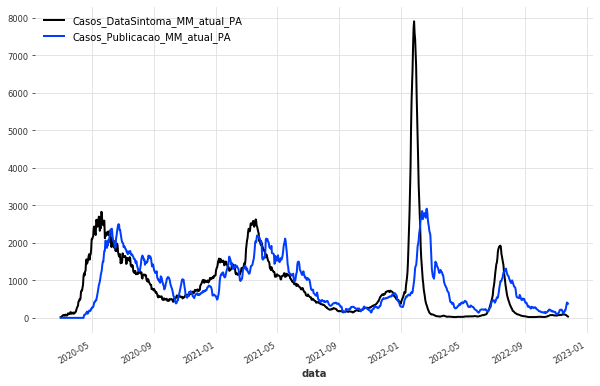

In [ ]:
# criação das séries temporais alvos de casos
serie_caso_sintoma = timeseries.TimeSeries.from_dataframe(df=caso_sintoma, time_col='data')
serie_caso_publicacao = timeseries.TimeSeries.from_dataframe(df=caso_publicacao, time_col='data')

plt.figure(figsize = (10,6))

serie_caso_sintoma.plot()
serie_caso_publicacao.plot()

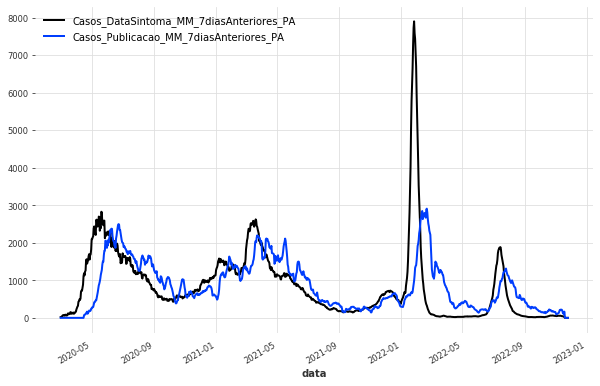

In [ ]:
# criação das séries temporais auxiliares de casos
serie_caso_sintoma_7DiasAnteriores = timeseries.TimeSeries.from_dataframe(df=caso_sintoma_7DiasAnteriores, time_col='data')
serie_caso_publicacao_7DiasAnteriores = timeseries.TimeSeries.from_dataframe(df=caso_publicacao_7DiasAnteriores, time_col='data')

plt.figure(figsize = (10, 6))

serie_caso_sintoma_7DiasAnteriores.plot()
serie_caso_publicacao_7DiasAnteriores.plot()

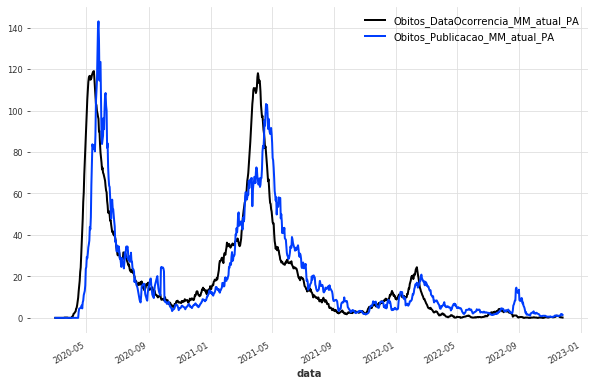

In [ ]:
# criação das séries temporais alvos de obitos
serie_obito_ocorrencia = timeseries.TimeSeries.from_dataframe(df=obito_ocorrencia, time_col='data')
serie_obito_publicacao = timeseries.TimeSeries.from_dataframe(df=obito_publicacao, time_col='data')

plt.figure(figsize = (10,6))

serie_obito_ocorrencia.plot()
serie_obito_publicacao.plot()

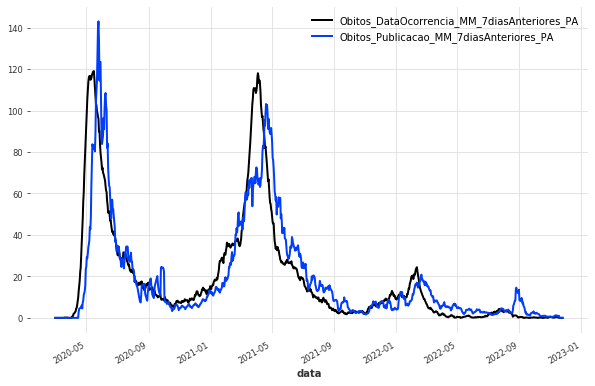

In [ ]:
# criação das séries temporais auxiliares de Obitos
serie_obito_ocorrencia_7DiasAnteriores = timeseries.TimeSeries.from_dataframe(df=obito_ocorrencia_7DiasAnteriores, time_col='data')
serie_obito_publicacao_7DiasAnteriores = timeseries.TimeSeries.from_dataframe(df=obito_publicacao_7DiasAnteriores, time_col='data')

plt.figure(figsize = (10, 6))

serie_obito_ocorrencia_7DiasAnteriores.plot()
serie_obito_publicacao_7DiasAnteriores.plot()

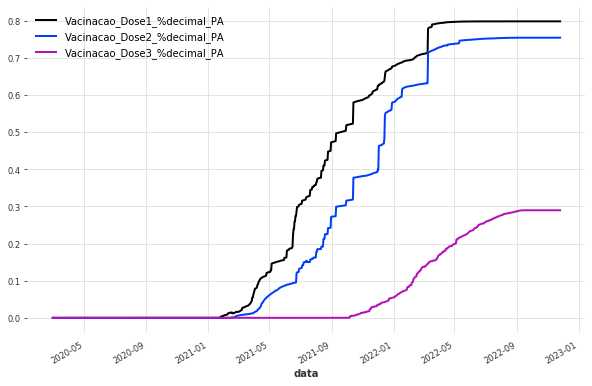

In [ ]:
# criação das séries temporais auxiliares de vacinação
serie_vacinacao_1Dose = timeseries.TimeSeries.from_dataframe(df=vacinacao_1Dose, time_col='data')
serie_vacinacao_2Dose = timeseries.TimeSeries.from_dataframe(df=vacinacao_2Dose, time_col='data')
serie_vacinacao_3Dose = timeseries.TimeSeries.from_dataframe(df=vacinacao_3Dose, time_col='data')

plt.figure(figsize = (10, 6))

serie_vacinacao_1Dose.plot()
serie_vacinacao_2Dose.plot()
serie_vacinacao_3Dose.plot()

## Filtro de suaviação das variáveis

In [ ]:
def filter_for_suavization(serie):
  filterKalman = KalmanFilter(dim_x = 1)
  filterKalman.fit(serie)
  serieTemp_filtered = filterKalman.filter(serie)

  return serieTemp_filtered

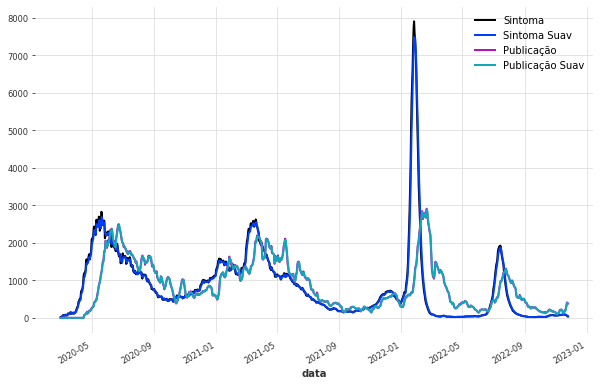

In [ ]:
#Suavização das series alvos de casos
serie_caso_sintoma_suav = filter_for_suavization(serie_caso_sintoma)
serie_caso_publicacao_suav = filter_for_suavization(serie_caso_publicacao)

plt.figure(figsize = (10, 6))

serie_caso_sintoma.plot(label="Sintoma")
serie_caso_sintoma_suav.plot(label="Sintoma Suav")
serie_caso_publicacao.plot(label="Publicação")
serie_caso_publicacao_suav.plot(label="Publicação Suav")

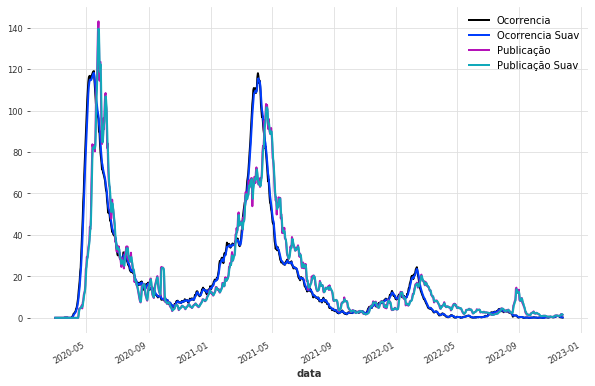

In [ ]:
#Suavização das series alvos de obitos
serie_obito_ocorrencia_suav = filter_for_suavization(serie_obito_ocorrencia)
serie_obito_publicacao_suav = filter_for_suavization(serie_obito_publicacao)

plt.figure(figsize = (10, 6))

serie_obito_ocorrencia.plot(label="Ocorrencia")
serie_obito_ocorrencia_suav.plot(label="Ocorrencia Suav")
serie_obito_publicacao.plot(label="Publicação")
serie_obito_publicacao_suav.plot(label="Publicação Suav")

## Escalar (normalização entre 0 e 1)

In [ ]:
def process_scaler(serie):
  #Pré-processamento - scalar (normalizar entre 0 e 1)
  Scaler_obj = Scaler()
  serieTemp_scaled = Scaler_obj.fit_transform(serie)

  return serieTemp_scaled, Scaler_obj
  #Retorno: Objeto Scaler da série, objeto scaler da covariável, serie temporal já normalizada

In [ ]:
#pré-processamento e normalização [0, 1]
serie_caso_sintoma_norm, Scaler_caso_sintoma = process_scaler(serie_caso_sintoma_suav)
serie_caso_publicacao_norm, Scaler_caso_publicacao = process_scaler(serie_caso_publicacao_suav)
serie_caso_sintoma_7DiasAnteriores_norm, Scaler_caso_sintoma_7dias = process_scaler(serie_caso_sintoma_7DiasAnteriores)
serie_caso_publicacao_7DiasAnteriores_norm, Scaler_caso_publicacao_7dias = process_scaler(serie_caso_publicacao_7DiasAnteriores)

serie_obito_ocorrencia_norm, Scaler_obito_ocorrencia = process_scaler(serie_obito_ocorrencia_suav)
serie_obito_publicacao_norm, Scaler_obito_publicacao = process_scaler(serie_obito_publicacao_suav)
serie_obito_ocorrencia_7DiasAnteriores_norm, Scaler_obito_ocorrencia_7dias = process_scaler(serie_obito_ocorrencia_7DiasAnteriores)
serie_obito_publicacao_7DiasAnteriores_norm, Scaler_obito_publicacao_7dias = process_scaler(serie_obito_publicacao_7DiasAnteriores)

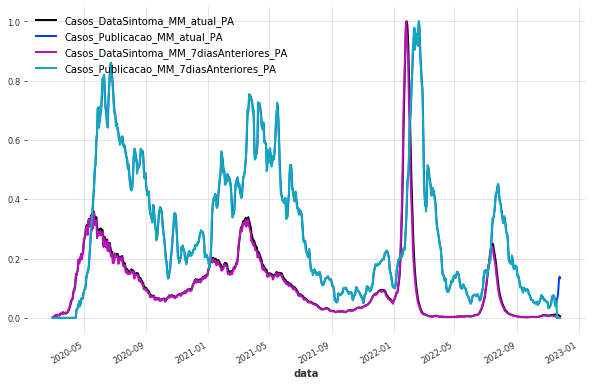

In [ ]:
plt.figure(figsize = (10, 6))

serie_caso_sintoma_norm.plot()
serie_caso_publicacao_norm.plot()
serie_caso_sintoma_7DiasAnteriores_norm.plot()
serie_caso_publicacao_7DiasAnteriores_norm.plot()

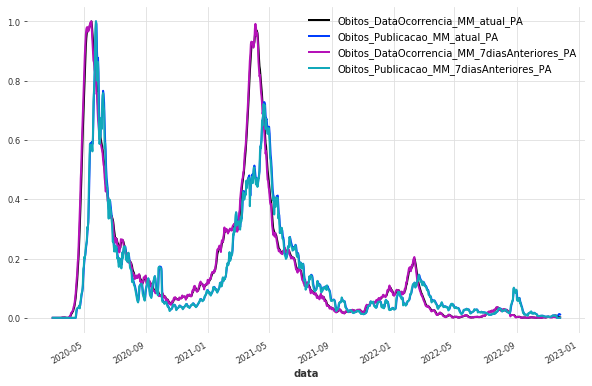

In [ ]:
plt.figure(figsize = (10, 6))

serie_obito_ocorrencia_norm.plot()
serie_obito_publicacao_norm.plot()
serie_obito_ocorrencia_7DiasAnteriores_norm.plot()
serie_obito_publicacao_7DiasAnteriores_norm.plot()

## Definição de Covariáveis

In [ ]:
def define_covariate_dates(serie_temp_normalizada):  #modificar nomes
  #Definir covariavel ano
  scaler_CovarYear, scaler_CovarMonth = Scaler(), Scaler()
  covariate_y = datetime_attribute_timeseries(serie_temp_normalizada, attribute='year', add_length = num_days_forecast)
  covariate_y = scaler_CovarYear.fit_transform(covariate_y)

  #Definir covariavel mes
  covariate_m = datetime_attribute_timeseries(serie_temp_normalizada, attribute='month', add_length = num_days_forecast)
  covariate_m = scaler_CovarMonth.fit_transform(covariate_m)

  #Definir covariavel day of week
  covariate_dw = datetime_attribute_timeseries(serie_temp_normalizada, attribute='dayofweek', add_length = num_days_forecast)
  covariate_dw = scaler_CovarMonth.fit_transform(covariate_dw)

  return covariate_y, covariate_m, covariate_dw

In [ ]:
#definição das covariáveis
covariate_year, covariate_month, covariate_dayweek = define_covariate_dates(serie_caso_sintoma_norm)

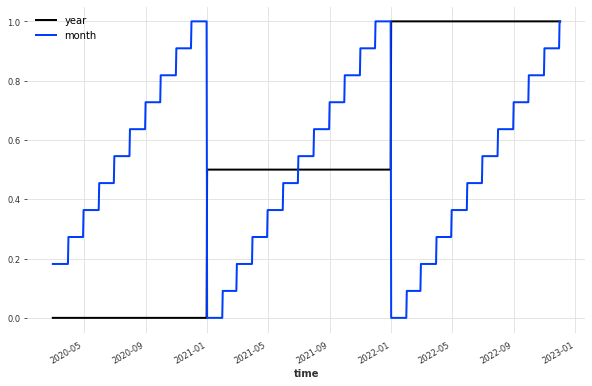

In [ ]:
#Visualização das series covariaveis de data
plt.figure(figsize = (10, 6))
covariate_year.plot()
covariate_month.plot()

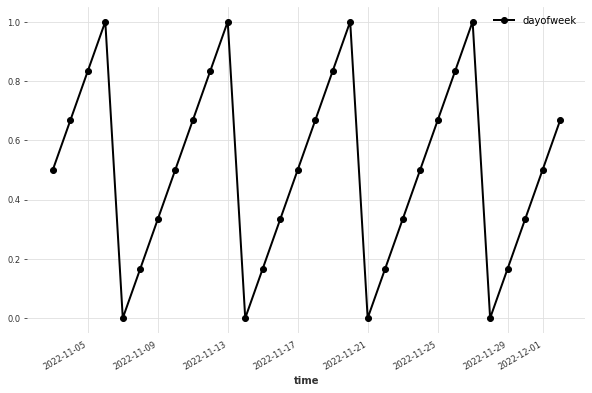

In [ ]:
plt.figure(figsize = (10, 6))
covariate_dayweek[-30:].plot(marker='o')

# Uso do Modelo

## Preparação das variaveis de entrada do modelo

In [ ]:
#Junção das variaveis alvo e coovariaveis
series_caso_norm = serie_caso_sintoma_norm.stack(serie_caso_publicacao_norm)
series_obito_norm = serie_obito_ocorrencia_norm.stack(serie_obito_publicacao_norm)

covariatesDate = covariate_year.stack(covariate_month.stack(covariate_dayweek))
covariatesVacination = serie_vacinacao_1Dose.stack(serie_vacinacao_2Dose.stack(serie_vacinacao_3Dose))
covariatesCases = serie_caso_sintoma_7DiasAnteriores_norm.stack(serie_caso_publicacao_7DiasAnteriores_norm)
covariatesDeaths = serie_obito_ocorrencia_7DiasAnteriores_norm.stack(serie_obito_publicacao_7DiasAnteriores_norm.stack(serie_caso_sintoma_norm.stack(serie_caso_publicacao_norm.stack(serie_caso_sintoma_7DiasAnteriores_norm.stack(serie_caso_publicacao_7DiasAnteriores_norm)))))

covariates_casos = covariatesDate[:-num_days_forecast].stack(covariatesCases.stack(covariatesVacination))
covariates_obitos = covariatesDate[:-num_days_forecast].stack(covariatesDeaths.stack(covariatesVacination))

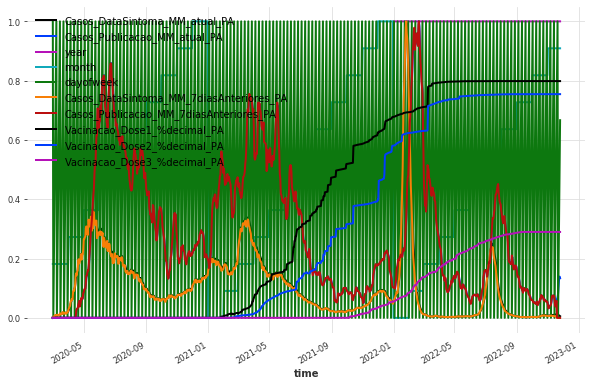

In [ ]:
#Plot covariaveis dos casos
plt.figure(figsize = (10, 6))
series_caso_norm.plot()
covariates_casos.plot()

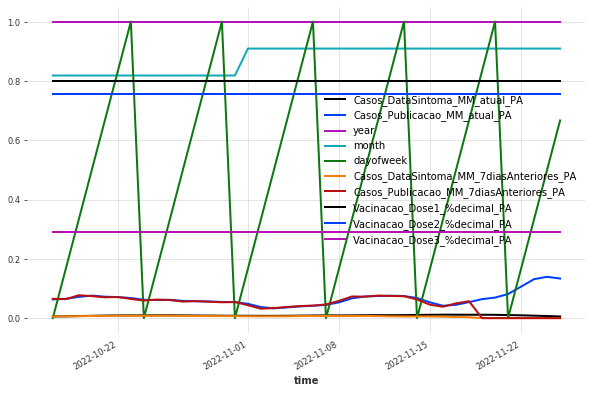

In [ ]:
plt.figure(figsize = (10, 6))
series_caso_norm[-40:].plot()
covariates_casos[-40:].plot()

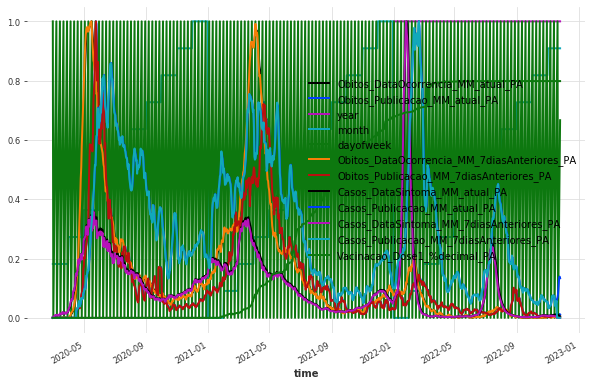

In [ ]:
#Plot covariaveis dos obitos
plt.figure(figsize = (10, 6))
series_obito_norm.plot()
covariates_obitos.plot()

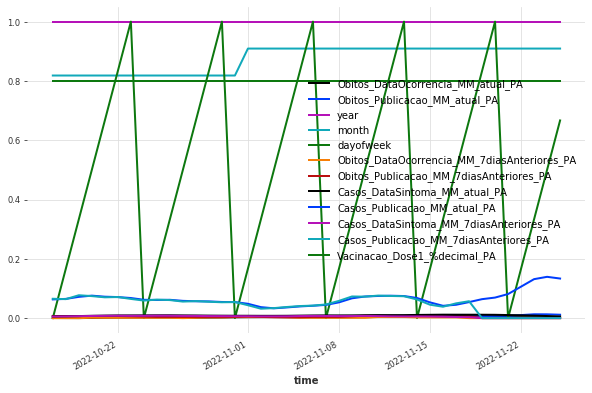

In [ ]:
plt.figure(figsize = (10, 6))
series_obito_norm[-40:].plot()
covariates_obitos[-40:].plot()

## Projeção de séries temporais com o modelo selecionado

In [ ]:
def generate_hist_forecast(model,series,covariates,forecast_days,name_serie):
  #Uso do modelo sobre os dados históricos
  serie_hist_fcast = model.historical_forecasts(
      series = series,
      past_covariates = covariates,
      start = forecast_days*5,
      forecast_horizon = forecast_days,
      stride = 1,# 7 forecast_days,
      num_samples = 50,
      retrain = False,
      verbose = False
      )
  
  return serie_hist_fcast[name_serie]

In [ ]:
def generate_ahead_forecast(model,series,covariates,forecast_days,name_serie):
  #Uso do modelo para predição de num_days_forecast a frente
  serie_predict = model.predict(
      n=forecast_days,
      series=series,
      past_covariates=covariates,
      num_samples = 50,
      n_jobs = -1,
      verbose = False
      ) 
 
  return serie_predict[name_serie]

In [ ]:
serie_caso_sintoma_hist_forecast = generate_hist_forecast(model_casos_sintoma,series_caso_norm,covariates_casos,num_days_forecast, serie_name_caso_sintoma)
serie_caso_publicacao_hist_forecast = generate_hist_forecast(model_casos_publicacao,series_caso_norm,covariates_casos,num_days_forecast, serie_name_caso_publicacao)

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

Predicting: 0it [00:00, ?it/s]

In [ ]:
serie_caso_sintoma_ahead_forecast = generate_ahead_forecast(model_casos_sintoma,series_caso_norm,covariates_casos,num_days_forecast, serie_name_caso_sintoma)
serie_caso_publicacao_ahead_forecast = generate_ahead_forecast(model_casos_publicacao,series_caso_norm,covariates_casos,num_days_forecast, serie_name_caso_publicacao)

In [ ]:
serie_obito_ocorrencia_hist_forecast = generate_hist_forecast(model_obitos_ocorrencia,series_obito_norm,covariates_obitos,num_days_forecast, serie_name_obito_ocorrencia)
serie_obito_publicacao_hist_forecast = generate_hist_forecast(model_obitos_publicacao,series_obito_norm,covariates_obitos,num_days_forecast, serie_name_obito_publicacao)

ValueError: ignored

In [ ]:
serie_obito_ocorrencia_ahead_forecast = generate_ahead_forecast(model_obitos_ocorrencia,series_obito_norm,covariates_obitos,num_days_forecast, serie_name_obito_ocorrencia)
serie_obito_publicacao_ahead_forecast = generate_ahead_forecast(model_obitos_publicacao,series_obito_norm,covariates_obitos,num_days_forecast, serie_name_obito_publicacao)

ValueError: ignored

# **Exportação e visualização**

## Re-escala e preparação para plotagem e exportação

In [ ]:
def process_re_scaling(Scaler_serie, serie_scaled): 
  #Volta para a escala original
  serie_back = Scaler_serie.inverse_transform(serie_scaled)  
  
  return serie_back

In [ ]:
def plot_preparation (scaler, hist_forecast, ahead_forecast, serie_name):
  # Re-escala e prearação da predição histórica
  serie_hist_forecast_median = process_re_scaling(scaler, hist_forecast.median())
  serie_hist_forecast_min = process_re_scaling(scaler, hist_forecast.min())
  serie_hist_forecast_max = process_re_scaling(scaler, hist_forecast.max())

  hist_forecast_median = serie_hist_forecast_median.pd_dataframe()
  hist_forecast_min = serie_hist_forecast_min.pd_dataframe()
  hist_forecast_max = serie_hist_forecast_max.pd_dataframe()

  hist_forecast_median[serie_name] = np.where(hist_forecast_median[serie_name] < 0, 0, hist_forecast_median[serie_name])
  hist_forecast_min[serie_name] = np.where(hist_forecast_min[serie_name] < 0, 0, hist_forecast_min[serie_name])
  hist_forecast_max[serie_name] = np.where(hist_forecast_max[serie_name] < 0, 0, hist_forecast_max[serie_name])


  # Re-escala e preparação da predição futura
  serie_ahead_forecast_median = process_re_scaling(scaler, ahead_forecast.median())
  serie_ahead_forecast_min = process_re_scaling(scaler, ahead_forecast.min())
  serie_ahead_forecast_max = process_re_scaling(scaler, ahead_forecast.max())

  ahead_forecast_median = serie_ahead_forecast_median.pd_dataframe()
  ahead_forecast_min = serie_ahead_forecast_min.pd_dataframe()
  ahead_forecast_max = serie_ahead_forecast_max.pd_dataframe()

  ahead_forecast_median[serie_name] = np.where(ahead_forecast_median[serie_name] < 0, 0, ahead_forecast_median[serie_name])
  ahead_forecast_min[serie_name] = np.where(ahead_forecast_min[serie_name] < 0, 0, ahead_forecast_min[serie_name])
  ahead_forecast_max[serie_name] = np.where(ahead_forecast_max[serie_name] < 0, 0, ahead_forecast_max[serie_name])


  #Ajuste dos nomes das colunas de tempo
  hist_forecast_median.index.name = 'data'
  hist_forecast_min.index.name = 'data'
  hist_forecast_max.index.name = 'data'


  #Concatenação dos dados
  median = pd.concat([hist_forecast_median, ahead_forecast_median])
  min = pd.concat([hist_forecast_min, ahead_forecast_min])
  max = pd.concat([hist_forecast_max, ahead_forecast_max])
  return median, min, max

In [ ]:
#Preparação dos dados para plotagem
serie_caso_sintoma_plot = serie_caso_sintoma.pd_dataframe()
caso_sintoma_median, caso_sintoma_min, caso_sintoma_max = plot_preparation(Scaler_caso_sintoma, serie_caso_sintoma_hist_forecast,
                                                                           serie_caso_sintoma_ahead_forecast, serie_name_caso_sintoma)

In [ ]:
#Preparação dos dados para plotagem
serie_caso_publicacao_plot = serie_caso_publicacao.pd_dataframe()
caso_publicacao_median, caso_publicacao_min, caso_publicacao_max = plot_preparation(Scaler_caso_publicacao, serie_caso_publicacao_hist_forecast,
                                                                                    serie_caso_publicacao_ahead_forecast, serie_name_caso_publicacao)

In [ ]:
#Preparação dos dados para plotagem
serie_obito_ocorrencia_plot = serie_obito_ocorrencia.pd_dataframe()
obito_ocorrencia_median, obito_ocorrencia_min, obito_ocorrencia_max = plot_preparation(Scaler_obito_ocorrencia, serie_obito_ocorrencia_hist_forecast,
                                                                                       serie_obito_ocorrencia_ahead_forecast, serie_name_obito_ocorrencia)

In [ ]:
#Preparação dos dados para plotagem
serie_obito_publicacao_plot = serie_obito_publicacao.pd_dataframe()
obito_publicacao_median, obito_publicacao_min, obito_publicacao_max = plot_preparation(Scaler_obito_publicacao, serie_obito_publicacao_hist_forecast,
                                                                                       serie_obito_publicacao_ahead_forecast, serie_name_obito_publicacao)

##Exportação dos dataframes com as predições

In [ ]:
#Caminho para salvar os resultados
results_folder_casos = '/content/drive/MyDrive/NPCA - COVID/_CASOS/ResultsOfSelectedModel'
results_folder_obitos = '/content/drive/MyDrive/NPCA - COVID/_OBITOS/ResultsOfSelectedModel'


#Testar se o caminho existe, e o criar em caso negativo
caso_osExists = os.path.exists(results_folder_casos)
obito_osExists = os.path.exists(results_folder_obitos)

if not caso_osExists:
  os.mkdir(results_folder_casos)
if not obito_osExists:
  os.mkdir(results_folder_obitos)


#Exportação
current_date = datetime.today().strftime('%d_%m_%Y')

caso_sintoma_median.to_csv(path_or_buf = f'{results_folder_casos}/casos_sintoma_forecast_{model_name_casos_sintoma}_{current_date}.csv')
caso_publicacao_median.to_csv(path_or_buf = f'{results_folder_casos}/casos_publicacao_forecast_{model_name_casos_publicacao}_{current_date}.csv')

obito_ocorrencia_median.to_csv(path_or_buf = f'{results_folder_obitos}/obitos_ocorrencia_forecast_{model_name_obitos_ocorrencia}_{current_date}.csv')
obito_publicacao_median.to_csv(path_or_buf = f'{results_folder_obitos}/obitos_publicacao_forecast_{model_name_obitos_publicacao}_{current_date}.csv')

In [ ]:
# Renomear colunas por conveniencia
caso_sintoma_min = caso_sintoma_min.rename(columns = {'Casos_DataSintoma_MM_atual_PA':'Casos_DataSintoma_Min'}, inplace = False)
caso_sintoma_max = caso_sintoma_max.rename(columns = {'Casos_DataSintoma_MM_atual_PA':'Casos_DataSintoma_Max'}, inplace = False)

caso_publicacao_min = caso_publicacao_min.rename(columns = {'Casos_Publicacao_MM_atual_PA':'Casos_Publicacao_Min'}, inplace = False)
caso_publicacao_max = caso_publicacao_max.rename(columns = {'Casos_Publicacao_MM_atual_PA':'Casos_Publicacao_Max'}, inplace = False)

obito_ocorrencia_min = obito_ocorrencia_min.rename(columns = {'Obitos_DataOcorrencia_MM_atual_PA':'Obitos_DataOcorrencia_Min'}, inplace = False)
obito_ocorrencia_max = obito_ocorrencia_max.rename(columns = {'Obitos_DataOcorrencia_MM_atual_PA':'Obitos_DataOcorrencia_Max'}, inplace = False)

obito_publicacao_min = obito_publicacao_min.rename(columns = {'Obitos_Publicacao_MM_atual_PA':'Obitos_Publicacao_Min'}, inplace = False)
obito_publicacao_max = obito_publicacao_max.rename(columns = {'Obitos_Publicacao_MM_atual_PA':'Obitos_Publicacao_Max'}, inplace = False)


# Concatenação da margem de erro em uma so variavel
caso_sintoma_MarginOfError = pd.concat([caso_sintoma_min, caso_sintoma_max], axis=1)
caso_publicacao_MarginOfError = pd.concat([caso_publicacao_min, caso_publicacao_max], axis=1)
obito_ocorrencia_MarginOfError = pd.concat([obito_ocorrencia_min, obito_ocorrencia_max], axis=1)
obito_publicacao_MarginOfError = pd.concat([obito_publicacao_min, obito_publicacao_max], axis=1)


#Exportação
caso_sintoma_MarginOfError.to_csv(path_or_buf = f'{results_folder_casos}/casos_sintomas_MarginOfError_{model_name_casos_sintoma}_{current_date}.csv')
caso_publicacao_MarginOfError.to_csv(path_or_buf = f'{results_folder_casos}/casos_publicacao_MarginOfError_{model_name_casos_publicacao}_{current_date}.csv')

obito_ocorrencia_MarginOfError.to_csv(path_or_buf = f'{results_folder_obitos}/obitos_ocorrencia_MarginOfError_{model_name_obitos_ocorrencia}_{current_date}.csv')
obito_publicacao_MarginOfError.to_csv(path_or_buf = f'{results_folder_obitos}/obitos_publicacao_MarginOfError_{model_name_obitos_publicacao}_{current_date}.csv')

##Visualização das projeções e exportação dos gráficos

In [ ]:
#Função responsavel pela plotagem geral
def plot(median, min, max, ssp, titulo, pasta, date):
  plt.style.use('seaborn-dark-palette')
  fig, ax = plt.subplots(figsize=(18, 6))


  ax.plot(ssp, lw=1.5, linestyle='solid', label='Observed') #Dados observados
  ax.plot(median[:-6], lw=1.5, linestyle='solid', label='Historical forecast') #Historical
  ax.plot(median[-7:], lw=1.5, linestyle='solid', label='Ahead forecast') #Predição
  ax.fill_between(median.index, np.array(min).flatten(), np.array(max).flatten(), alpha=.15, label='Margin of error') #Margem de erro
  ax.axvline(x=median.index[-7], alpha=.5, linestyle='--') #Linha vertical


  min, max = ax.get_ylim()
  ax.yaxis.set_ticks(np.arange(0, max, max/20))
  ax.xaxis.set_major_locator(mdates.DayLocator(interval=20)) #Intervalo entre as marcações de tempo
  ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d')) #Formatação das datas


  ax.legend(loc='upper left', ncol = 2, fancybox=True, edgecolor='Black', framealpha=1)
  ax.set(title=titulo) #Titulo
  ax.margins(0.015, tight=True)
  ax.grid(True)


  fig.autofmt_xdate(rotation=75) #Angulo das datas
  fig.tight_layout()
  
  
  fig.savefig(f'{pasta}/Plots/{titulo} - {date}.png', dpi=300) #Salvar as imagens

In [ ]:
#Função responsavel pela plotagem dos ultimos 30 dias
def plot_30(median, min, max, ssp, titulo, pasta, date):
  #Criação de series com apenas os ultimos 30 dias
  median_30 = median.tail(30)
  min_30 = min.tail(30)
  max_30 = max.tail(30)
  ssp_30 = ssp.tail(23) #O original para no 23 pq os ultimos 7 são predição


  plt.style.use('seaborn-dark-palette')
  fig, ax = plt.subplots(figsize=(18, 6))


  ax.plot(ssp_30, lw=1.5, linestyle='solid', label='Observed') #Dados observados
  ax.plot(median_30[:-6], lw=1.5, linestyle='solid', label='Historical forecast') #Historical
  ax.plot(median_30[-7:], lw=1.5, linestyle='solid', label='Ahead forecast') #Predição
  ax.fill_between(median_30.index, np.array(min_30).flatten(), np.array(max_30).flatten(), color='darkgreen', alpha=.15, label='Margin of error') #Margem de erro
  ax.axvline(x=median_30.index[-7], alpha=.5, linestyle='--') #Linha vertical


  min, max = ax.get_ylim()
  ax.yaxis.set_ticks(np.arange(0, max, max/20))
  ax.xaxis.set_major_locator(mdates.DayLocator(interval=1)) #Intervalo entre as marcações de tempo
  ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d')) #Formatação das datas


  ax.legend(loc='upper left', ncol = 2, fancybox=True, edgecolor='Black', framealpha=1)
  ax.set(title=titulo) #Titulo
  ax.margins(0.015, tight=True)
  ax.grid(True)


  fig.autofmt_xdate(rotation=75) #Angulo das datas
  fig.tight_layout()


  fig.savefig(f'{pasta}/Plots/{titulo}_{date}.png', dpi=300) #Salvar as imagens

In [ ]:
# Plot casos - sintomas - total
titulo_caso_sintomas = f"Forecast of cases by day of the first symptoms (moving average) - {model_name_casos_sintoma}"
plot(caso_sintoma_median, caso_sintoma_min, caso_sintoma_max, serie_caso_sintoma_plot, titulo_caso_sintomas, results_folder_casos, current_date)

In [ ]:
# Plot casos - sintomas - ultimos 30 dias
titulo_caso_sintomas_30 = f"Forecast of cases by day of the first symptoms (moving average) - Last 30 days - {model_name_casos_sintoma}"
plot_30(caso_sintoma_median, caso_sintoma_min, caso_sintoma_max, serie_caso_sintoma_plot, titulo_caso_sintomas_30, results_folder_casos, current_date)

In [ ]:
# Plot casos - publicação - total
titulo_caso_publicação = f"Forecast of cases by day of publication (moving average) - {model_name_casos_publicacao}"
plot(caso_publicacao_median, caso_publicacao_min, caso_publicacao_max, serie_caso_publicacao_plot, titulo_caso_publicação, results_folder_casos, current_date)

In [ ]:
# Plot casos - publicação - ultimos 30 dias
titulo_caso_publicação_30 = f"Forecast of cases by day of publication (moving average) - Last 30 days - {model_name_casos_publicacao}"
plot_30(caso_publicacao_median, caso_publicacao_min, caso_publicacao_max, serie_caso_publicacao_plot, titulo_caso_publicação_30, results_folder_casos, current_date)

In [ ]:
# Plot obitos - ocorrencia - total
titulo_obito_ocorrencias = f'Forecast of deaths by day of occurrence (moving average) - {model_name_obitos_ocorrencia}'
plot(obito_ocorrencia_median, obito_ocorrencia_min, obito_ocorrencia_max, serie_obito_ocorrencia_plot, titulo_obito_ocorrencias, results_folder_obitos, current_date)

In [ ]:
# Plot obitos - ocorrencia - ultimos 30 dias
titulo_obito_ocorrencias_30 = f'Forecast of deaths by day of occurrence (moving average) - Last 30 days - {model_name_obitos_ocorrencia}'
plot_30(obito_ocorrencia_median, obito_ocorrencia_min, obito_ocorrencia_max, serie_obito_ocorrencia_plot, titulo_obito_ocorrencias_30, results_folder_obitos, current_date)

In [ ]:
# Plot obitos - publicaçao - total
titulo_obito_publicação = f'Forecast of deaths by day of publication (moving average) - {model_name_obitos_publicacao}'
plot(obito_publicacao_median, obito_publicacao_min, obito_publicacao_max, serie_obito_publicacao_plot, titulo_obito_publicação, results_folder_obitos, current_date)

In [ ]:
# Plot obitos - publicaçao - ultimos 30 dias
titulo_obito_publicação_30 = f'Forecast of deaths by day of publication (moving average) - Last 30 days - {model_name_obitos_publicacao}'
plot_30(obito_publicacao_median, obito_publicacao_min, obito_publicacao_max, serie_obito_publicacao_plot, titulo_obito_publicação_30, results_folder_obitos, current_date)